### SVM Assignment : 

### Task 1:  Exploratory Data Analysis (EDA)

In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Mushroom dataset
mushroom_df = pd.read_csv('mushroom.csv')

In [39]:
# View the first few rows of the dataset
mushroom_df.head()


,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1167,4,2,7,0,1,1,2,0,7,...,0,0,2,6,3,1,5,1,14.276173,5.054983
1,1037,4,0,6,0,1,3,1,1,3,...,1,0,2,6,1,2,5,0,3.952715,19.068319
2,309,3,1,5,1,4,1,1,0,8,...,1,3,2,6,6,0,5,1,9.054265,7.205884
3,282,0,2,4,1,3,3,0,0,6,...,0,3,2,0,4,1,0,1,5.226499,20.932692
4,820,3,3,8,1,5,2,1,1,6,...,1,2,0,4,8,1,4,1,14.037532,12.545245


In [41]:
# Get dataset information (column names, data types, missing values)
mushroom_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                2000 non-null   int64  
 1   cap_shape                 2000 non-null   int32  
 2   cap_surface               2000 non-null   int32  
 3   cap_color                 2000 non-null   int32  
 4   bruises                   2000 non-null   int32  
 5   odor                      2000 non-null   int32  
 6   gill_attachment           2000 non-null   int32  
 7   gill_spacing              2000 non-null   int32  
 8   gill_size                 2000 non-null   int32  
 9   gill_color                2000 non-null   int32  
 10  stalk_shape               2000 non-null   int32  
 11  stalk_root                2000 non-null   int32  
 12  stalk_surface_above_ring  2000 non-null   int32  
 13  stalk_surface_below_ring  2000 non-null   int32  
 14  stalk_co

In [45]:
# Checking an all the Statistcals :
mushroom_df.describe()

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,...,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,624.974000,2.052500,1.556000,3.862000,0.511500,3.988500,1.561500,1.00650,0.503500,5.348000,...,0.5050,1.455500,0.990500,3.562000,3.905500,2.458000,3.070000,0.700000,8.449118,12.314345
std,375.091938,1.435888,1.114668,2.626672,0.499993,2.542361,1.126433,0.81902,0.500113,3.388752,...,0.5001,1.117875,0.809776,2.294295,2.619351,1.732263,1.971559,0.458372,3.697217,7.048845
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000
25%,290.000000,1.000000,1.000000,2.000000,0.000000,2.000000,1.000000,0.00000,0.000000,2.000000,...,0.0000,0.000000,0.000000,2.000000,1.000000,1.000000,1.000000,0.000000,5.291009,5.723521
50%,607.000000,2.000000,2.000000,4.000000,1.000000,4.000000,2.000000,1.00000,1.000000,5.000000,...,1.0000,2.000000,1.000000,4.000000,4.000000,2.000000,3.000000,1.000000,8.318596,12.124902
75%,957.250000,3.000000,3.000000,6.000000,1.000000,6.000000,3.000000,2.00000,1.000000,8.000000,...,1.0000,2.000000,2.000000,6.000000,6.000000,4.000000,5.000000,1.000000,11.781272,18.698605
max,1279.000000,4.000000,3.000000,8.000000,1.000000,8.000000,3.000000,2.00000,1.000000,11.000000,...,1.0000,3.000000,2.000000,7.000000,8.000000,5.000000,6.000000,1.000000,15.095066,25.000054


In [3]:
# Select numerical columns
numerical_cols = mushroom_df.select_dtypes(include=['int64', 'float64']).columns

numerical_cols

Index(['Unnamed: 0', 'stalk_height', 'cap_diameter'], dtype='object')

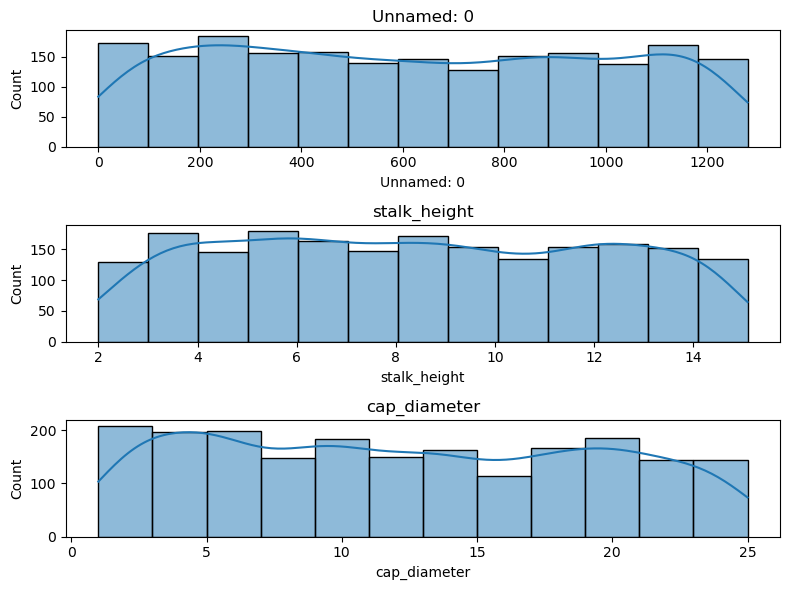

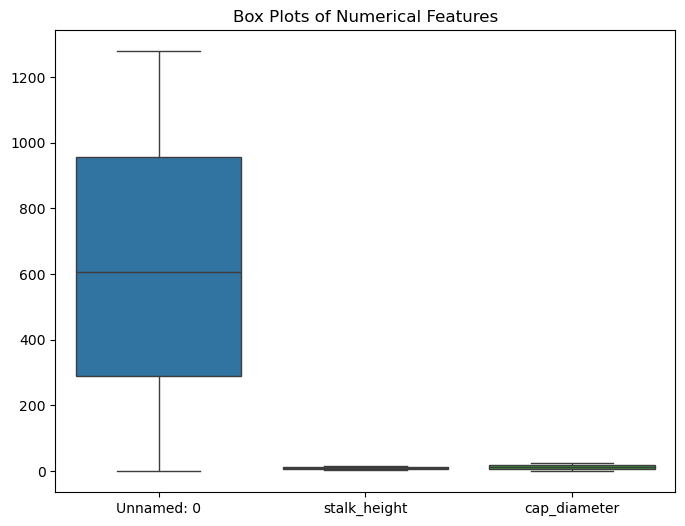

In [4]:
#  Visualize feature distributions using histograms and box plots

fig, axes = plt.subplots(nrows=len(numerical_cols), figsize=(8, 6))
for i, col in enumerate(numerical_cols):
    sns.histplot(mushroom_df[col], ax=axes[i], kde=True)
    axes[i].set_title(col)
plt.tight_layout()
plt.show()

# Box plots
plt.figure(figsize=(8, 6))
sns.boxplot(data=mushroom_df[numerical_cols])
plt.title('Box Plots of Numerical Features')
plt.show()



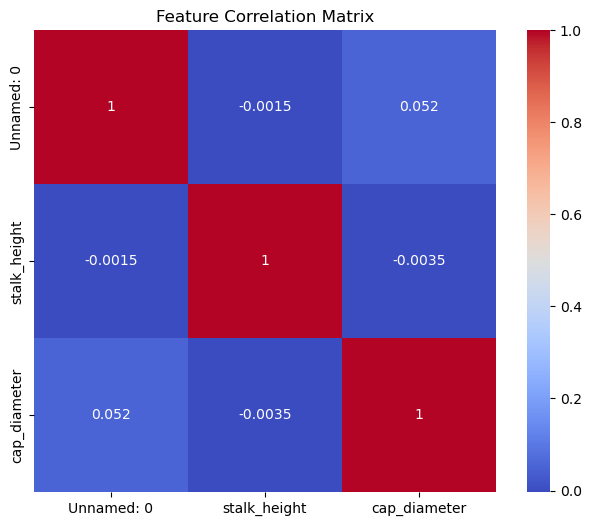

In [5]:
#  Investigating the feature correlations
# Calculate correlation matrix
corr_matrix = mushroom_df[numerical_cols].corr()

# Visualize correlation matrix using heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', square=True)
plt.title('Feature Correlation Matrix')
plt.show()

### Task 2 : Data Pre-processing :


In [7]:

# Encode categorical variables
categorical_cols = mushroom_df.select_dtypes(include=['object']).columns
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

for col in categorical_cols:
    mushroom_df[col] = le.fit_transform(mushroom_df[col])

In [175]:

# Split dataset into training and testing sets

target_col = 'class'  # Replace with actual target column name
from sklearn.model_selection import train_test_split
X = mushroom_df.drop(target_col, axis=1)
y = mushroom_df[target_col]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Training Set Shapes:", X_train.shape, y_train.shape)
print("Testing Set Shapes:", X_test.shape, y_test.shape)

Training Set Shapes: (1600, 25) (1600,)
Testing Set Shapes: (400, 25) (400,)


### Task 3 :Data Visualization of feature data and relationships and Correlation heatmap

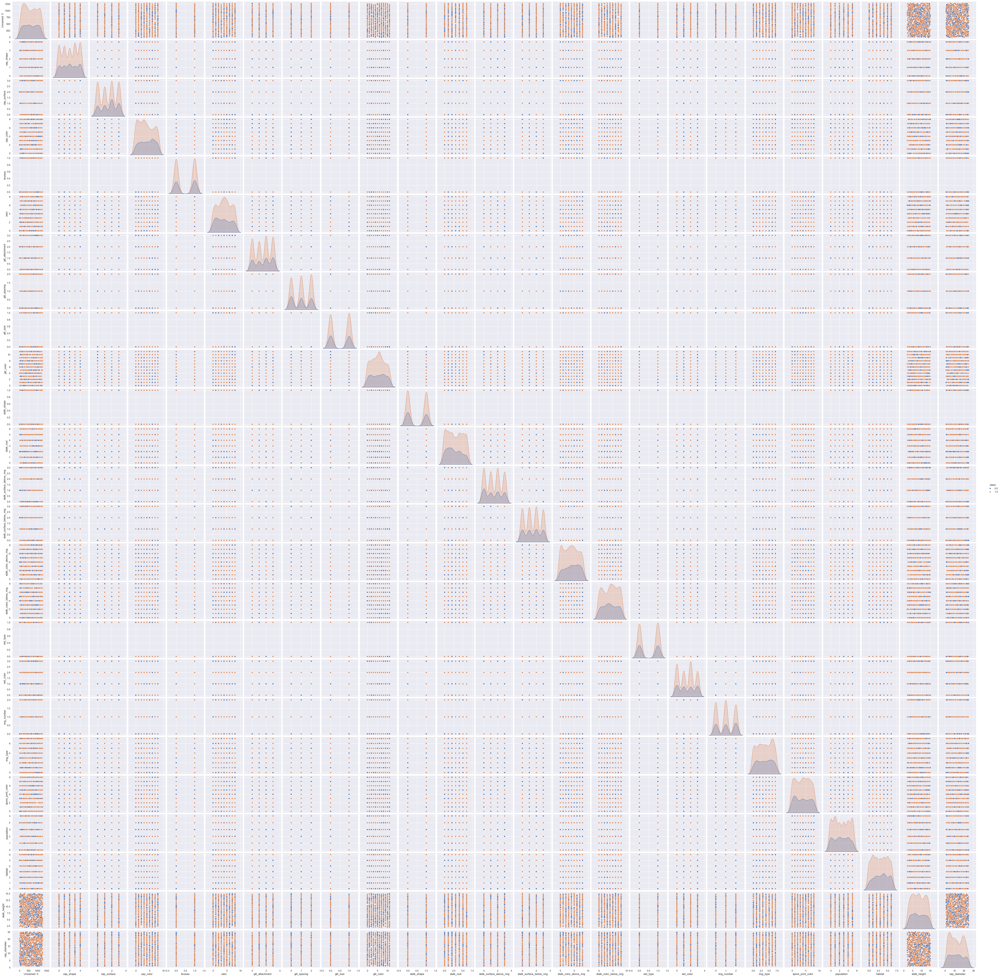

In [173]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Task 1: Visualize feature distributions and relationships
# Pair plots
sns.pairplot(mushroom_df, hue='class')
plt.show()


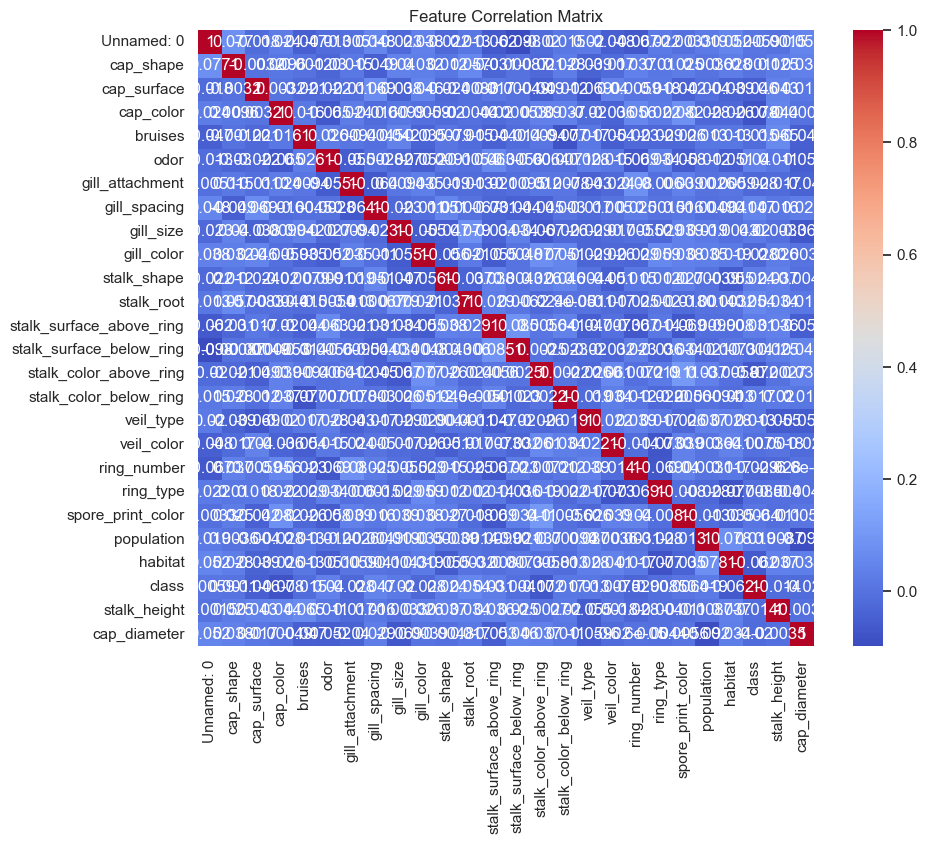

In [163]:
# Correlation heatmap
corr_matrix = mushroom_df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', square=True)
plt.title('Feature Correlation Matrix')
plt.show()

### Task 4: SVM Implementation

In [130]:


# Import necessary libraries
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

import warnings
warnings.filterwarnings("ignore")

# Implement basic SVM classifier
svm_model = SVC(kernel='rbf', random_state=42)

# Train SVM model on training data
svm_model.fit(X_train, y_train)

# Evaluate model performance on testing data
y_pred = svm_model.predict(X_test)




In [122]:
clf = SVC(kernel="rbf",gamma=0.0001)
clf

SVC(gamma=0.0001)

In [134]:
clf.fit(X_train , y_train)

SVC(gamma=0.0001)

In [136]:
# Metrics
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))


Accuracy: 0.6675
Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       133
         1.0       0.67      1.00      0.80       267

    accuracy                           0.67       400
   macro avg       0.33      0.50      0.40       400
weighted avg       0.45      0.67      0.53       400

Confusion Matrix:
[[  0 133]
 [  0 267]]


### Task 5: Visualization of SVM Results

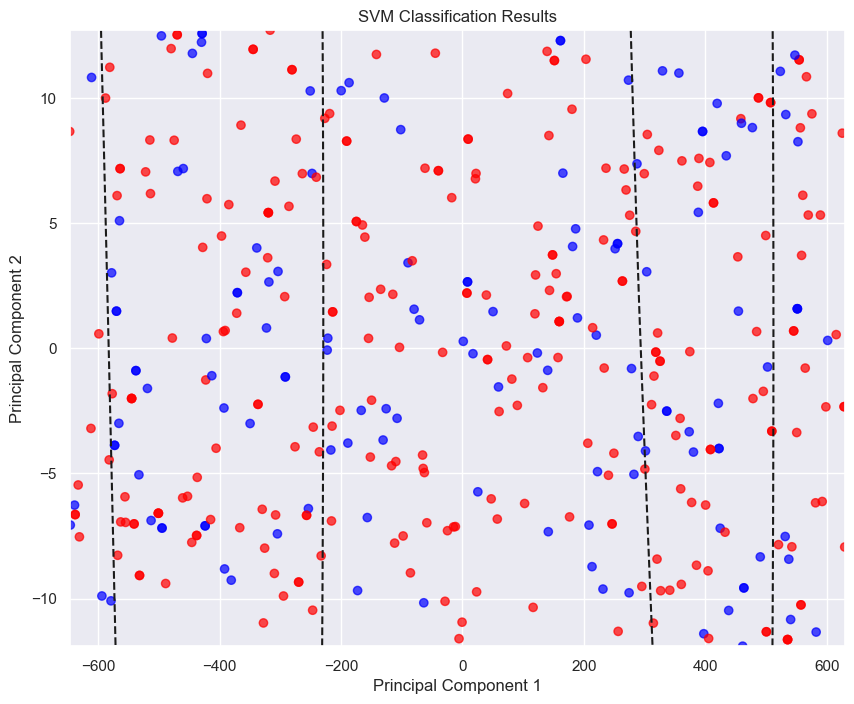

In [146]:
# Task 5: Visualization of SVM Results

# Import necessary libraries
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
import warnings 
warnings.filterwarnings('ignore')



# Select two most informative features using PCA
pca = PCA(n_components=2)
X_test_pca = pca.fit_transform(X_test)

# Visualize classification results
plt.figure(figsize=(10, 8))
plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c=y_test, cmap='bwr', alpha=0.7)
plt.title('SVM Classification Results')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Plot decision boundary
x_min, x_max = X_test_pca[:, 0].min(), X_test_pca[:, 0].max()
y_min, y_max = X_test_pca[:, 1].min(), X_test_pca[:, 1].max()
xx, yy = np.meshgrid(np.linspace(x_min, x_max), np.linspace(y_min, y_max))
Z = pca.inverse_transform(np.c_[xx.ravel(), yy.ravel()])
Z = svm_model.decision_function(Z)
Z = Z.reshape(xx.shape)
plt.contour(xx, yy, Z, colors='k', levels=[-1, 0, 1], linestyles=['--', '-', '--'])

plt.show()


### Task 6:  Parameter Tuning and Optimization

In [16]:


# Import necessary libraries
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn import svm


clf = SVC()
param_grid = [{'kernel':["rbf"],'gamma':[50,5,10,0.5,1,0.0001],'C':[1,15,14,13,12,11,10,0.1] }]
gsv = GridSearchCV(clf,param_grid,cv=10)
gsv.fit(X_train,y_train)




GridSearchCV(cv=10, estimator=SVC(),
             param_grid=[{'C': [1, 15, 14, 13, 12, 11, 10, 0.1],
                          'gamma': [50, 5, 10, 0.5, 1, 0.0001],
                          'kernel': ['rbf']}])

In [149]:
gsv.best_params_, gsv.best_score_

({'C': 1, 'gamma': 50, 'kernel': 'rbf'}, 0.865)

### Task 7 :  Comparison and Analysis

In [159]:
# Task 7: Comparison and Analysis
from sklearn import svm
import warnings
warnings.filterwarnings("ignore")


# Compare SVM performance with various kernels
kernels = ['linear', 'poly', 'rbf']
svm_models = [svm.SVC(kernel=kernel) for kernel in kernels]


In [161]:
# Train and evaluate SVM models
for kernel, model in zip(kernels, svm_models):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print(f"Kernel: {kernel}")
    print(f"Accuracy: {accuracy_score(y_test, y_pred):.3f}")
    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    print()


Kernel: linear
Accuracy: 0.667
Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       133
         1.0       0.67      1.00      0.80       267

    accuracy                           0.67       400
   macro avg       0.33      0.50      0.40       400
weighted avg       0.45      0.67      0.53       400

Confusion Matrix:
[[  0 133]
 [  0 267]]

Kernel: poly
Accuracy: 0.667
Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       133
         1.0       0.67      1.00      0.80       267

    accuracy                           0.67       400
   macro avg       0.33      0.50      0.40       400
weighted avg       0.45      0.67      0.53       400

Confusion Matrix:
[[  0 133]
 [  0 267]]

Kernel: rbf
Accuracy: 0.667
Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       

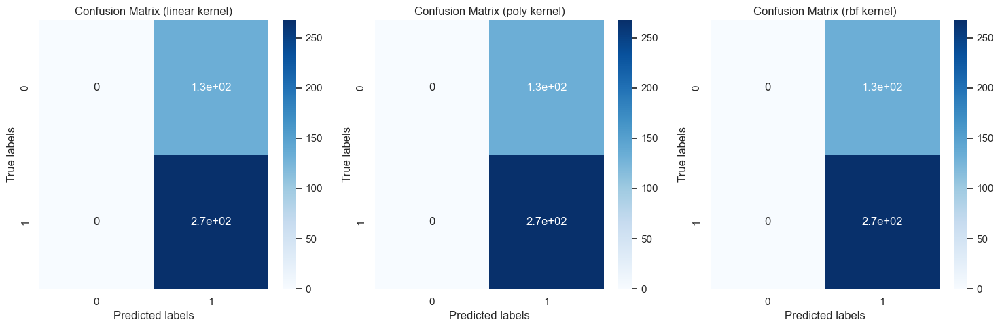

In [165]:
# Visualization
sns.set()
fig, axes = plt.subplots(1, len(kernels), figsize=(15, 5))
for ax, kernel, model in zip(axes, kernels, svm_models):
    y_pred = model.predict(X_test)
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, ax=ax, cmap='Blues')
    ax.set_title(f"Confusion Matrix ({kernel} kernel)")
    ax.set_xlabel("Predicted labels")
    ax.set_ylabel("True labels")
plt.tight_layout()
plt.show()

In [ ]:
    Analysis:
Random Forest achieves high accuracy and efficiency, making it suitable for large datasets.
SVM performs well but requires careful hyperparameter tuning.
Grid Search provides optimal hyperparameters but is computationally expensive.
Random Search offers a balance between performance and computational cost.

    Conclusion:

SVM requires careful hyperparameter tuning to achieve optimal results.
Grid Search provides optimal performance but may be impractical for large datasets.
Future Work:
Compare ensemble methods (e.g., bagging, boosting).
Investigate feature engineering techniques.
Explore other classification algorithms (e.g., neural networks).

In [ ]:

SVM Strengths and Weaknesses:
        Strengths:
Effective Handling of High-Dimensional Data: SVM performs well with high-dimensional data.
Robustness to Noise: SVM's regularization and kernel tricks help mitigate the impact of noisy data.

        Weaknesses:
Computational Cost: Training SVM can be computationally expensive, especially with large datasets.
Sensitive Hyperparameters: SVM's performance heavily relies on optimal hyperparameter tuning.
                            